# Using pycisTopic on multiple multiome samples from the mouse cortex

In [1]:
import warnings
warnings.simplefilter(action='ignore')
import pandas
import pycisTopic
pycisTopic.__version__

'1.0.1.dev67+gfc9b4d0'

Raw data used in this tutorial is available in GEO (GSE210749).

Processed loom files are available at: https://scope.aertslab.org/#/scenic-v2

A UCSC session is available at: https://genome-euro.ucsc.edu/s/cbravo/SCENIC%2B_Cortex

## 0. Setting up the analysis directories & common variables

The following variables are used to define the default directories to store/load data from the current notebook (any of them can be modified in the individual steps).

* **Project directory:** used as default as root directory for the notebook. In this tutorial it also contains the *input data* (e.g. fragments files, annotations...). In case the different types of files are in distinct locations, replace them individually in the required steps. 

In [2]:
# Project directory
projDir = '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/'

* **Output directory:** to save the *results* from the analyses:

In [3]:
# Output directory
outDir = projDir + 'TEW_cortex/pycisTopic/tutorial/'
import os
if not os.path.exists(outDir):
    os.makedirs(outDir)

* **TMP directory:** to store *temporary* files: 

In [4]:
# Temp dir
tmpDir = '/scratch/leuven/313/vsc31305/'

* **Others:** Most of the input parameters for the following sections are explained and defined in each step. 
These are some of the recurrent ones that you might want to set globally to avoid copy/pasing several times. For example, the input *fragments file* corresponding to each sample. It should be stored as a dictionary (the *sample ids* used as *keys* should match the sample ids in the *annotation* data frame).

In [5]:
## Path to fragments files of samples
fragments_path = '/staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/'
fragments_dict = {'10x_no_perm': fragments_path+'TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/atac_fragments.tsv.gz',
                 'TST_NP40_004': fragments_path+'TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004/outs/atac_fragments.tsv.gz',
                 'TST': fragments_path+'TEW__75da5c__5b0f59__Multiome_brain_TST/outs/atac_fragments.tsv.gz',
                 '10x_complex_UC': fragments_path+'TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC/outs/atac_fragments.tsv.gz',
                 '10x_complex': fragments_path+'TEW__d112c8__547ada__Multiome_RNA_brain_10x_complex/outs/atac_fragments.tsv.gz'}

Note that in this tutorial we will only run the steps necessary within the SCENIC+ workflow. For a detailed workflow of all pycisTopic features, check the human cerebellum tutorial.

## 1. Getting pseudobulk profiles from cell annotations 

In this tutorial we assume we are analyzing the scATAC-seq data from a ***multiome*** dataset, which allows to easily get the cell annotations from the scRNA-seq analysis. In case of ***independent scATAC-seq data***, the cell annotation can also be obtained from alternative methods, such as unnanotated/preliminary clustering analysis (using predefined regions, for example SCREEN for mouse and human). In the later case, you can skip this section and use bulk regions as input to the QC step.

The barcode ***metadata*** should be provided as a `pd.DataFrame`.

* The **index*** of the pandas dataframe should correspond to BARCODE (e.g. ATGTCTGATAGA-1, additional tags are possible using `___`; e.g. ATGTCTGATAGA-1___sample_1) **and** it must contain a **'sample_id'** column indicating the sample label fo origin. It is also possible to use other separation pattern (e.g. `-`), but then it will have to be specified in the function.

* Alternative: add a **column named 'barcode'** to the metadata with the corresponding cell barcodes (in this case the name of the cells will not be used to infer the barcode id). This is the option we use in this tutorial as well.

In this example, we will load the barcode metadata from the scRNA-seq analysis stored in a loom file. For each sample we have different sample_id names for the barcodes. In this case, we will simplify them a bit, and make sure they match with the keys in the fragments file.

In [6]:
# Get metadata from loom file
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
path_to_annotated_rna_loom = projDir + 'data/MO_GEX_seurat_Cortex.loom'
loom = SCopeLoom.read_loom(path_to_annotated_rna_loom)
cell_data = get_metadata(loom)

In [7]:
# Format sample names to match those in dictionary
cell_data = get_metadata(loom)
cell_data = cell_data.replace('TEW__c14e1d__Multiome_RNA_brain_10x_no_perm', '10x_no_perm')
cell_data = cell_data.replace('TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004', 'TST_NP40_004')
cell_data = cell_data.replace('TEW__75da5c__5b0f59__Multiome_brain_TST', 'TST')
cell_data = cell_data.replace('TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC', '10x_complex_UC')
cell_data = cell_data.replace('TEW__d112c8__547ada__Multiome_RNA_brain_10x_complex', '10x_complex')

In [8]:
# Add barcode column
cell_data['barcode'] = [x.split('___')[0] for x in cell_data.index.tolist()]

In order to produce the bigwig files, we also need to know the overall ***size of the chromosomes***. We can easily download this information from the UCSC.

In [9]:
# Get chromosome sizes (for mm10 here)
import pyranges as pr
import requests
target_url='http://hgdownload.cse.ucsc.edu/goldenPath/mm10/bigZips/mm10.chrom.sizes'
chromsizes=pd.read_csv(target_url, sep='\t', header=None)
chromsizes.columns=['Chromosome', 'End']
chromsizes['Start']=[0]*chromsizes.shape[0]
chromsizes=chromsizes.loc[:,['Chromosome', 'Start', 'End']]
# Exceptionally in this case, to agree with CellRangerARC annotations
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].replace('_random', '') for x in range(len(chromsizes['Chromosome']))]
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].split('_')[1] if len(chromsizes['Chromosome'][x].split('_')) > 1 else chromsizes['Chromosome'][x] for x in range(len(chromsizes['Chromosome']))]
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x]+'.1' if 'chr' not in chromsizes['Chromosome'][x] else chromsizes['Chromosome'][x] for x in range(len(chromsizes['Chromosome']))]
chromsizes=pr.PyRanges(chromsizes)

Now we have all the ingredients we need  to generate the pseudobulk files. With this function we will generate fragments files per group and the corresponding bigwigs. The mandatory input to this function are:
* The annotation dataframe (`input_data`)
* The `variable` used to group the cells
* The chromosome sizes
* The paths to where the bed and bigiwg files will be written
* A dictionary indicating the fragments file corresponsing to each sample. **The sample ids used as keys in this dictionary must match with the sample ids in the annotation data frame!**

The output will be two dictionaries containing the paths to the bed and bigwig files, respectively, to each group.

In [13]:
os.mkdir(outDir + 'consensus_peak_calling')
os.mkdir(outDir + 'consensus_peak_calling/pseudobulk_bed_files/')
os.mkdir(outDir + 'consensus_peak_calling/pseudobulk_bw_files/')
from pycisTopic.pseudobulk_peak_calling import *
bw_paths, bed_paths = export_pseudobulk(input_data = cell_data,
                 variable = 'conserved_cell_type',
                 sample_id_col = 'sample_id',
                 chromsizes = chromsizes,
                 bed_path = outDir + 'consensus_peak_calling/pseudobulk_bed_files/',
                 bigwig_path = outDir + 'consensus_peak_calling/pseudobulk_bw_files/',
                 path_to_fragments = fragments_dict,
                 n_cpu = 5,
                 normalize_bigwig = True,
                 remove_duplicates = True,
                 _temp_dir = tmpDir + 'ray_spill',
                 split_pattern = '___')

2022-08-08 18:12:52,230 cisTopic     INFO     Reading fragments from /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__014e25__c14e1d__Multiome_RNA_brain_10x_no_perm/outs/atac_fragments.tsv.gz
2022-08-08 18:20:13,993 cisTopic     INFO     Reading fragments from /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004/outs/atac_fragments.tsv.gz
2022-08-08 18:23:07,990 cisTopic     INFO     Reading fragments from /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__75da5c__5b0f59__Multiome_brain_TST/outs/atac_fragments.tsv.gz
2022-08-08 18:24:15,368 cisTopic     INFO     Reading fragments from /staging/leuven/stg_00002/lcb/lcb_projects/TEW/Multiome/cellranger_arc/mouse_brain/TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC/outs/atac_fragments.tsv.gz
2022-08-08 18:27:06,948 cisTopic     INFO     Reading fragments from /staging/leuven/stg_0000

2022-08-08 18:29:54,535	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(export_pseudobulk_ray pid=12108) 2022-08-08 18:30:07,800 cisTopic     INFO     Creating pseudobulk for AST
(export_pseudobulk_ray pid=12112) 2022-08-08 18:30:11,349 cisTopic     INFO     Creating pseudobulk for CGELAMP5
(export_pseudobulk_ray pid=12111) 2022-08-08 18:30:15,394 cisTopic     INFO     Creating pseudobulk for CGESNCG
(export_pseudobulk_ray pid=12110) 2022-08-08 18:30:19,196 cisTopic     INFO     Creating pseudobulk for CGEVIP
(export_pseudobulk_ray pid=12109) 2022-08-08 18:30:23,127 cisTopic     INFO     Creating pseudobulk for ENDO


(export_pseudobulk_ray pid=12108) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12108)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(export_pseudobulk_ray pid=12111) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12111) 

(export_pseudobulk_ray pid=12111) 2022-08-08 18:31:00,883 cisTopic     INFO     CGESNCG done!
(export_pseudobulk_ray pid=12111) 2022-08-08 18:31:01,629 cisTopic     INFO     Creating pseudobulk for L2_3IT
(export_pseudobulk_ray pid=12109) 2022-08-08 18:31:03,291 cisTopic     INFO     ENDO done!
(export_pseudobulk_ray pid=12109) 2022-08-08 18:31:03,912 cisTopic     INFO     Creating pseudobulk for L4IT


(export_pseudobulk_ray pid=12111) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12111)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(export_pseudobulk_ray pid=12109) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12109)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12112) 2022-08-08 18:31:41,040 cisTopic     INFO     CGELAMP5 done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:31:41,674 cisTopic     INFO     Creating pseudobulk for L5IT
(export_pseudobulk_ray pid=12110) 2022-08-08 18:31:55,565 cisTopic     INFO     CGEVIP done!
(export_pseudobulk_ray pid=12110) 2022-08-08 18:31:56,449 cisTopic     INFO     Creating pseudobulk for L5PT


(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(export_pseudobulk_ray pid=12110) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12110)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(raylet) Spilled 10462 MiB, 3 objects, write throughput 72 MiB/s. Set RAY_verbose_spill_logs=0 to disable this message.
(raylet) Spilled 41820 MiB, 8 objects, write throughput 272 MiB/s.


(export_pseudobulk_ray pid=12108) 2022-08-08 18:33:12,225 cisTopic     INFO     AST done!
(export_pseudobulk_ray pid=12108) 2022-08-08 18:33:12,973 cisTopic     INFO     Creating pseudobulk for L6CT


(export_pseudobulk_ray pid=12108) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12108)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(raylet) Spilled 52276 MiB, 10 objects, write throughput 261 MiB/s.
(raylet) Spilled 73193 MiB, 15 objects, write throughput 358 MiB/s.


(export_pseudobulk_ray pid=12110) 2022-08-08 18:35:14,805 cisTopic     INFO     L5PT done!
(export_pseudobulk_ray pid=12110) 2022-08-08 18:35:15,516 cisTopic     INFO     Creating pseudobulk for L6IT


(export_pseudobulk_ray pid=12110) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12110)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(raylet) Spilled 83649 MiB, 17 objects, write throughput 267 MiB/s.
(raylet) Spilled 94097 MiB, 18 objects, write throughput 291 MiB/s.


(export_pseudobulk_ray pid=12112) 2022-08-08 18:40:43,722 cisTopic     INFO     L5IT done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:40:44,941 cisTopic     INFO     Creating pseudobulk for L6ITCAR3


(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12112) 2022-08-08 18:41:08,402 cisTopic     INFO     L6ITCAR3 done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:41:08,984 cisTopic     INFO     Creating pseudobulk for L6b


(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12110) 2022-08-08 18:42:07,940 cisTopic     INFO     L6IT done!
(export_pseudobulk_ray pid=12110) 2022-08-08 18:42:09,493 cisTopic     INFO     Creating pseudobulk for MGEPVALB
(export_pseudobulk_ray pid=12112) 2022-08-08 18:42:18,366 cisTopic     INFO     L6b done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:42:18,992 cisTopic     INFO     Creating pseudobulk for MGESST


(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])
(export_pseudobulk_ray pid=12110) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12110)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12109) 2022-08-08 18:44:44,301 cisTopic     INFO     L4IT done!
(export_pseudobulk_ray pid=12109) 2022-08-08 18:44:45,683 cisTopic     INFO     Creating pseudobulk for MGL


(raylet) Spilled 135910 MiB, 25 objects, write throughput 225 MiB/s.
(export_pseudobulk_ray pid=12109) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12109)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12112) 2022-08-08 18:46:01,206 cisTopic     INFO     MGESST done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:46:01,847 cisTopic     INFO     Creating pseudobulk for NP


(export_pseudobulk_ray pid=12112) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12112)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12109) 2022-08-08 18:46:34,605 cisTopic     INFO     MGL done!
(export_pseudobulk_ray pid=12109) 2022-08-08 18:46:35,134 cisTopic     INFO     Creating pseudobulk for OL


(export_pseudobulk_ray pid=12109) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12109)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12108) 2022-08-08 18:47:09,496 cisTopic     INFO     L6CT done!
(export_pseudobulk_ray pid=12108) 2022-08-08 18:47:10,368 cisTopic     INFO     Creating pseudobulk for OPC


(export_pseudobulk_ray pid=12108) /opt/venv/lib/python3.8/site-packages/pycisTopic/pseudobulk_peak_calling.py:273: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
(export_pseudobulk_ray pid=12108)   group_fragments = group_fragments_list[0].append(group_fragments_list[1:])


(export_pseudobulk_ray pid=12108) 2022-08-08 18:49:15,552 cisTopic     INFO     OPC done!
(export_pseudobulk_ray pid=12110) 2022-08-08 18:49:17,761 cisTopic     INFO     MGEPVALB done!
(export_pseudobulk_ray pid=12112) 2022-08-08 18:49:20,223 cisTopic     INFO     NP done!
(export_pseudobulk_ray pid=12111) 2022-08-08 18:50:14,682 cisTopic     INFO     L2_3IT done!
(export_pseudobulk_ray pid=12109) 2022-08-08 18:55:53,009 cisTopic     INFO     OL done!


In [14]:
# Save
import pickle 
with open(outDir + 'consensus_peak_calling/pseudobulk_bed_files/bed_paths.pkl', 'wb') as f:
  pickle.dump(bed_paths, f)

import pickle 
with open(outDir + 'consensus_peak_calling/pseudobulk_bed_files/bw_paths.pkl', 'wb') as f:
  pickle.dump(bw_paths, f)

## 2. Inferring consensus peaks

In the following step, we will use MACS2 to call peaks in each group (in this case, cell type). The default parameters are those recommended for ATAC-seq data.

In [15]:
import os
from pycisTopic.pseudobulk_peak_calling import *
macs_path='macs2'
macs_outdir = outDir + 'consensus_peak_calling/MACS/'
os.mkdir(macs_outdir)
# Run peak calling
narrow_peaks_dict = peak_calling(macs_path,
                                 bed_paths,
                                 macs_outdir,
                                 genome_size='mm',
                                 n_cpu=5,
                                 input_format='BEDPE',
                                 shift=73, 
                                 ext_size=146,
                                 keep_dup = 'all',
                                 q_value = 0.05,
                                 _temp_dir = tmpDir + 'ray_spill')

2022-08-08 18:56:15,536	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(macs_call_peak_ray pid=28499) 2022-08-08 18:56:20,895 cisTopic     INFO     Calling peaks for CGEVIP with macs2 callpeak --treatment /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/tutorial/consensus_peak_calling/pseudobulk_bed_files/CGEVIP.bed.gz --name CGEVIP  --outdir /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/tutorial/consensus_peak_calling/MACS/ --format BEDPE --gsize mm --qvalue 0.05 --nomodel --shift 73 --extsize 146 --keep-dup all --call-summits --nolambda
(macs_call_peak_ray pid=28502) 2022-08-08 18:56:20,896 cisTopic     INFO     Calling peaks for ENDO with macs2 callpeak --treatment /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/tutorial/consensus_peak_calling/pseudobulk_bed_files/ENDO.bed.gz --name ENDO  --outdir /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/ana

In [16]:
# Save
import pickle 
with open(outDir + 'consensus_peak_calling/MACS/narrow_peaks_dict.pkl', 'wb') as f:
  pickle.dump(narrow_peaks_dict, f)

Finally, it is time to derive the consensus peaks. To do so, we use the TGCA iterative peak filtering approach. First, each summit is extended a `peak_half_width` in each direction and then we iteratively filter out less significant peaks that overlap with a more significant one. During this procedure peaks will be merged and depending on the number of peaks included into them, different processes will happen:

* **1 peak**:  The original peak region will be kept
* **2 peaks**:  The original peak region with the highest score will be kept
* **3 or more peaks**:  The orignal peak region with the most significant score will be taken, and all the original peak regions in this merged peak region that overlap with the significant peak region will be removed. The process is repeated with the next most significant peak (if it was not removed already) until all peaks are processed.

This proccess will happen twice, first in each pseudobulk peaks; and after peak score normalization, to process all peaks together.

In [17]:
# Get chromosome sizes (for hg38 here). We need them to ensure that extending the summits we don't fall out of the chromosome.
import pyranges as pr
import requests
target_url='http://hgdownload.cse.ucsc.edu/goldenPath/mm10/bigZips/mm10.chrom.sizes'
chromsizes=pd.read_csv(target_url, sep='\t', header=None)
chromsizes.columns=['Chromosome', 'End']
chromsizes['Start']=[0]*chromsizes.shape[0]
chromsizes=chromsizes.loc[:,['Chromosome', 'Start', 'End']]
# Exceptionally in this case, to agree with CellRangerARC annotations
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].replace('v', '.') for x in range(len(chromsizes['Chromosome']))]
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].split('_')[1] if len(chromsizes['Chromosome'][x].split('_')) > 1 else chromsizes['Chromosome'][x] for x in range(len(chromsizes['Chromosome']))]
chromsizes=pr.PyRanges(chromsizes)

In [18]:
from pycisTopic.iterative_peak_calling import *
# Other param
peak_half_width=250
path_to_blacklist='/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/pycisTopic/blacklist/mm10-blacklist.v2.bed'
# Get consensus peaks
consensus_peaks=get_consensus_peaks(narrow_peaks_dict, peak_half_width, chromsizes=chromsizes, path_to_blacklist=path_to_blacklist) 

2022-08-08 19:06:51,806 cisTopic     INFO     Extending and merging peaks per class
2022-08-08 19:11:28,050 cisTopic     INFO     Normalizing peak scores
2022-08-08 19:11:29,514 cisTopic     INFO     Merging peaks
Warning! Start and End columns now have different dtypes: int64 and int32
2022-08-08 19:14:29,843 cisTopic     INFO     Done!


In [19]:
# Write to bed
consensus_peaks.to_bed(path= outDir + 'consensus_peak_calling/consensus_regions.bed', keep=True, compression='infer', chain=False)

## 3. QC

The next step is to perform QC in the scATAC-seq samples (in this case, only one run). There are several measurements and visualizations performed in this step:

* Barcode rank plot
* Duplication rate
* Insertion size
* TSS enrichment
* Fraction of Reads In Peaks (FRIP)

To calculate the TSS enrichment we need to provide TSS annotations. You can easily download them via pybiomart.

In [6]:
# Get TSS annotations
import pybiomart as pbm
# For mouse (mm39)
#dataset = pbm.Dataset(name='mmusculus_gene_ensembl',  host='http://www.ensembl.org')
# For mouse (mm10)
dataset = pbm.Dataset(name='mmusculus_gene_ensembl',  host='http://nov2020.archive.ensembl.org/')
# For human (hg38)
#dataset = pbm.Dataset(name='hsapiens_gene_ensembl',  host='http://www.ensembl.org')
# For human (hg19)
#dataset = pbm.Dataset(name='hsapiens_gene_ensembl',  host='http://grch37.ensembl.org/')
# For fly (dm6)
# dataset = pbm.Dataset(name='dmelanogaster_gene_ensembl',  host='http://www.ensembl.org')
annot = dataset.query(attributes=['chromosome_name', 'transcription_start_site', 'strand', 'external_gene_name', 'transcript_biotype'])
annot['Chromosome/scaffold name'] = annot['Chromosome/scaffold name'].astype('str')
filter = annot['Chromosome/scaffold name'].str.contains('CHR|GL|JH|MT')
annot = annot[~filter]
annot['Chromosome/scaffold name'] = annot['Chromosome/scaffold name'].str.replace(r'(\b\S)', r'chr\1')
annot.columns=['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
annot = annot[annot.Transcript_type == 'protein_coding']

If you want to run all (or several of) the metrics, you can use the `compute_qc_stats()` function. As input you need to provide a dictionary containing the fragments files per sample and another dictionary the corresponding regions to use to estimate the FRIP. 

In [9]:
from pycisTopic.qc import *
## Set regions. We will use the consensus peaks we have just called, but we could also use the bulk peaks per sample instead for this step
path_to_regions= {'10x_no_perm': outDir + 'consensus_peak_calling/consensus_regions.bed',
                 'TST_NP40_004': outDir + 'consensus_peak_calling/consensus_regions.bed',
                 'TST': outDir + 'consensus_peak_calling/consensus_regions.bed',
                 '10x_complex_UC': outDir + 'consensus_peak_calling/consensus_regions.bed',
                 '10x_complex': outDir + 'consensus_peak_calling/consensus_regions.bed'}
metadata_bc, profile_data_dict = compute_qc_stats(fragments_dict = fragments_dict,
                tss_annotation = annot,
                stats=['barcode_rank_plot', 'duplicate_rate', 'insert_size_distribution', 'profile_tss', 'frip'],
                label_list = None,
                path_to_regions = path_to_regions,
                n_cpu = 5,
                valid_bc = None,
                n_frag = 100,
                n_bc = None,
                tss_flank_window = 1000,
                tss_window = 50,
                tss_minimum_signal_window = 100,
                tss_rolling_window = 10,
                remove_duplicates = True,
                _temp_dir = tmpDir + 'ray_spill')

2022-08-08 19:41:23,728	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(compute_qc_stats_ray pid=27353) 2022-08-08 19:41:27,335 cisTopic     INFO     Reading 10x_no_perm
(compute_qc_stats_ray pid=27350) 2022-08-08 19:41:27,356 cisTopic     INFO     Reading TST
(compute_qc_stats_ray pid=27352) 2022-08-08 19:41:27,406 cisTopic     INFO     Reading 10x_complex_UC
(compute_qc_stats_ray pid=27351) 2022-08-08 19:41:27,436 cisTopic     INFO     Reading TST_NP40_004
(compute_qc_stats_ray pid=27354) 2022-08-08 19:41:27,468 cisTopic     INFO     Reading 10x_complex
(compute_qc_stats_ray pid=27350) 2022-08-08 19:42:10,087 cisTopic     INFO     Computing barcode rank plot for TST
(compute_qc_stats_ray pid=27350) 2022-08-08 19:42:10,087 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=27350) 2022-08-08 19:42:13,765 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=27350) 2022-08-08 19:42:13,836 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=27350) 2022-08-08 19:42:13,839 cisTopic     INFO     Ret

(compute_qc_stats_ray pid=27350) /tmp/ipykernel_4532/2386079543.py:534: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27350) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27350) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27350) 
(compute_qc_stats_ray pid=27350) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27350) /tmp/ipykernel_4532/2386079543.py:535: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27350) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27350) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27350) 
(compute_qc_stats_ray pid=27350) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:07,383 cisTopic     INFO     Computing barcode rank plot for 10x_complex
(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:07,384 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:15,171 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:15,256 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:15,257 cisTopic     INFO     Returning valid barcodes
(compute_qc_stats_ray pid=27351) 2022-08-08 19:43:16,413 cisTopic     INFO     Computing barcode rank plot for TST_NP40_004
(compute_qc_stats_ray pid=27351) 2022-08-08 19:43:16,414 cisTopic     INFO     Counting fragments


(compute_qc_stats_ray pid=27350) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:301: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27350) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27350) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27350) 
(compute_qc_stats_ray pid=27350) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27350)   overlap_with_TSS_start["rel_start_pos"] = (
(compute_qc_stats_ray pid=27350) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:304: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27350) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27350) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27350) 
(compute_qc_stats_ray pid=27350) See the caveats in the docum

(compute_qc_stats_ray pid=27352) 2022-08-08 19:43:20,566 cisTopic     INFO     Computing barcode rank plot for 10x_complex_UC
(compute_qc_stats_ray pid=27352) 2022-08-08 19:43:20,567 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=27351) 2022-08-08 19:43:24,847 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=27351) 2022-08-08 19:43:24,944 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=27351) 2022-08-08 19:43:24,948 cisTopic     INFO     Returning valid barcodes
(compute_qc_stats_ray pid=27354) 2022-08-08 19:43:25,060 cisTopic     INFO     Computing duplicate rate plot for 10x_complex
(compute_qc_stats_ray pid=27352) 2022-08-08 19:43:29,047 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=27352) 2022-08-08 19:43:29,139 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=27352) 2022-08-08 19:43:29,142 cisTopic     INFO     Returning valid barcodes
(compute_qc_sta

(compute_qc_stats_ray pid=27354) /tmp/ipykernel_4532/2386079543.py:534: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27354) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27354) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27354) 
(compute_qc_stats_ray pid=27354) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27354) /tmp/ipykernel_4532/2386079543.py:535: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27354) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27354) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27354) 
(compute_qc_stats_ray pid=27354) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(compute_qc_stats_ray pid=27351) 2022-08-08 19:44:52,100 cisTopic     INFO     Computing TSS profile for TST_NP40_004
(compute_qc_stats_ray pid=27352) 2022-08-08 19:44:57,754 cisTopic     INFO     Computing TSS profile for 10x_complex_UC
(compute_qc_stats_ray pid=27351) 2022-08-08 19:45:05,209 cisTopic     INFO     Formatting annnotation
(compute_qc_stats_ray pid=27351) 2022-08-08 19:45:05,250 cisTopic     INFO     Creating coverage matrix


(compute_qc_stats_ray pid=27351) /tmp/ipykernel_4532/2386079543.py:534: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27351) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27351) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27351) 
(compute_qc_stats_ray pid=27351) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27351) /tmp/ipykernel_4532/2386079543.py:535: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27351) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27351) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27351) 
(compute_qc_stats_ray pid=27351) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stat

(compute_qc_stats_ray pid=27352) 2022-08-08 19:45:10,794 cisTopic     INFO     Formatting annnotation
(compute_qc_stats_ray pid=27352) 2022-08-08 19:45:10,849 cisTopic     INFO     Creating coverage matrix


(compute_qc_stats_ray pid=27354) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:301: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27354) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27354) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27354) 
(compute_qc_stats_ray pid=27354) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27354)   overlap_with_TSS_start["rel_start_pos"] = (
(compute_qc_stats_ray pid=27354) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:304: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27354) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27354) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27354) 
(compute_qc_stats_ray pid=27354) See the caveats in the docum

(compute_qc_stats_ray pid=27353) 2022-08-08 19:45:51,008 cisTopic     INFO     Computing barcode rank plot for 10x_no_perm
(compute_qc_stats_ray pid=27353) 2022-08-08 19:45:51,008 cisTopic     INFO     Counting fragments


(compute_qc_stats_ray pid=27351) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:301: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27351) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27351) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27351) 
(compute_qc_stats_ray pid=27351) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27351)   overlap_with_TSS_start["rel_start_pos"] = (
(compute_qc_stats_ray pid=27351) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:304: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27351) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27351) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27351) 
(compute_qc_stats_ray pid=27351) See the caveats in the docum

(compute_qc_stats_ray pid=27354) 2022-08-08 19:45:53,428 cisTopic     INFO     Coverage matrix done
(compute_qc_stats_ray pid=27354) 2022-08-08 19:46:02,498 cisTopic     INFO     Returning normalized TSS coverage matrix per barcode


(compute_qc_stats_ray pid=27352) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:301: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27352) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27352) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27352) 
(compute_qc_stats_ray pid=27352) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27352)   overlap_with_TSS_start["rel_start_pos"] = (
(compute_qc_stats_ray pid=27352) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:304: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27352) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27352) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27352) 
(compute_qc_stats_ray pid=27352) See the caveats in the docum

(compute_qc_stats_ray pid=27353) 2022-08-08 19:46:09,539 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=27353) 2022-08-08 19:46:09,662 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=27353) 2022-08-08 19:46:09,667 cisTopic     INFO     Returning valid barcodes
(compute_qc_stats_ray pid=27354) 2022-08-08 19:46:09,722 cisTopic     INFO     Returning normalized sample TSS enrichment data
(compute_qc_stats_ray pid=27354) 2022-08-08 19:46:09,811 cisTopic     INFO     Computing FRIP profile for 10x_complex
(compute_qc_stats_ray pid=27354) 2022-08-08 19:46:11,136 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=27354) 2022-08-08 19:46:28,159 cisTopic     INFO     Intersecting fragments with regions
(compute_qc_stats_ray pid=27353) 2022-08-08 19:46:33,834 cisTopic     INFO     Computing duplicate rate plot for 10x_no_perm
(compute_qc_stats_ray pid=27351) 2022-08-08 19:46:47,431 cisTopic     INFO     Coverage matrix done

(compute_qc_stats_ray pid=27353) /tmp/ipykernel_4532/2386079543.py:534: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27353) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27353) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27353) 
(compute_qc_stats_ray pid=27353) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27353) /tmp/ipykernel_4532/2386079543.py:535: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27353) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27353) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27353) 
(compute_qc_stats_ray pid=27353) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(compute_qc_stats_ray pid=27353) 2022-08-08 19:50:28,643 cisTopic     INFO     Formatting annnotation
(compute_qc_stats_ray pid=27353) 2022-08-08 19:50:28,683 cisTopic     INFO     Creating coverage matrix


(compute_qc_stats_ray pid=27353) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:301: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27353) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27353) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27353) 
(compute_qc_stats_ray pid=27353) See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
(compute_qc_stats_ray pid=27353)   overlap_with_TSS_start["rel_start_pos"] = (
(compute_qc_stats_ray pid=27353) /opt/venv/lib/python3.8/site-packages/pycisTopic/utils.py:304: SettingWithCopyWarning: 
(compute_qc_stats_ray pid=27353) A value is trying to be set on a copy of a slice from a DataFrame.
(compute_qc_stats_ray pid=27353) Try using .loc[row_indexer,col_indexer] = value instead
(compute_qc_stats_ray pid=27353) 
(compute_qc_stats_ray pid=27353) See the caveats in the docum

(compute_qc_stats_ray pid=27353) 2022-08-08 19:53:22,262 cisTopic     INFO     Coverage matrix done
(compute_qc_stats_ray pid=27353) 2022-08-08 19:53:47,181 cisTopic     INFO     Returning normalized TSS coverage matrix per barcode
(compute_qc_stats_ray pid=27353) 2022-08-08 19:54:04,806 cisTopic     INFO     Returning normalized sample TSS enrichment data
(compute_qc_stats_ray pid=27353) 2022-08-08 19:54:04,885 cisTopic     INFO     Computing FRIP profile for 10x_no_perm
(compute_qc_stats_ray pid=27353) 2022-08-08 19:54:06,102 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=27353) 2022-08-08 19:54:56,711 cisTopic     INFO     Intersecting fragments with regions
(compute_qc_stats_ray pid=27353) 2022-08-08 19:57:19,566 cisTopic     INFO     Sample 10x_no_perm done!


In [12]:
os.makedirs(outDir+'quality_control')
import pickle 
with open(outDir + 'quality_control/metadata_bc.pkl', 'wb') as f:
  pickle.dump(metadata_bc, f)

import pickle 
with open(outDir + 'quality_control/profile_data_dict.pkl', 'wb') as f:
  pickle.dump(profile_data_dict, f)

### 3a. Sample-level statistics

Once the QC metrics have been computed you can visualize the results at the sample-level and the barcode-level. Sample-level statistics can be used to assess the overall quality of the sample, while barcode level statistics can be use to differentiate good quality cells versus the rest. The sample-level graphs include:

* **Barcode rank plot**: The barcode rank plot shows the distribution of non-duplicate reads and which barcodes were inferred to be associated with cells. A steep drop-off ('knee') is indicative of good separation between the cell-associated barcodes and the barcodes associated with empty partitions.

* **Insertion size**: ATAC-seq requires a proper pair of Tn5 transposase cutting events at the ends of DNA. In the nucleosome-free open chromatin regions, many molecules of Tn5 can kick in and chop the DNA into small pieces; around nucleosome-occupied regions, and Tn5 can only access the linker regions. Therefore, in a good ATAC-seq library, you should expect to see a sharp peak at the <100 bp region (open chromatin), and a peak at ~200bp region (mono-nucleosome), and other larger peaks (multi-nucleosomes). A clear nucleosome pattern indicates a good quality of the experiment.

* **Sample TSS enrichment**: The TSS enrichment calculation is a signal to noise calculation. The reads around a reference set of TSSs are collected to form an aggregate distribution of reads centered on the TSSs and extending to 1000 bp in either direction (for a total of 2000bp). This distribution is then normalized by taking the average read depth in the 100 bps at each of the end flanks of the distribution (for a total of 200bp of averaged data) and calculating a fold change at each position over that average read depth. This means that the flanks should start at 1, and if there is high read signal at transcription start sites (highly open regions of the genome) there should be an increase in signal up to a peak in the middle.

* **FRIP distribution**: Fraction of all mapped reads that fall into the called peak regions, i.e. usable reads in significantly enriched peaks divided by all usable reads. A low FRIP indicates that many reads form part of the background, and so that the data is noisy.

* **Duplication rate**: A fragment is considered “usable” if it uniquely maps to the genome and remains after removing PCR duplicates (defined as two fragments that map to the same genomic position and have the same unique molecular identifier). The duplication rate serves to estimate the amount of usable reads per barcode. High duplication rates may indicate over-sequencing or lack of fragments after transposition and encapsulation. We recommend using `duplicate_rate_as_hexbin = True` when working with big fragments files.

In [6]:
# Load sample metrics
import pickle
infile = open(outDir + 'quality_control/profile_data_dict.pkl', 'rb')
profile_data_dict = pickle.load(infile)
infile.close()

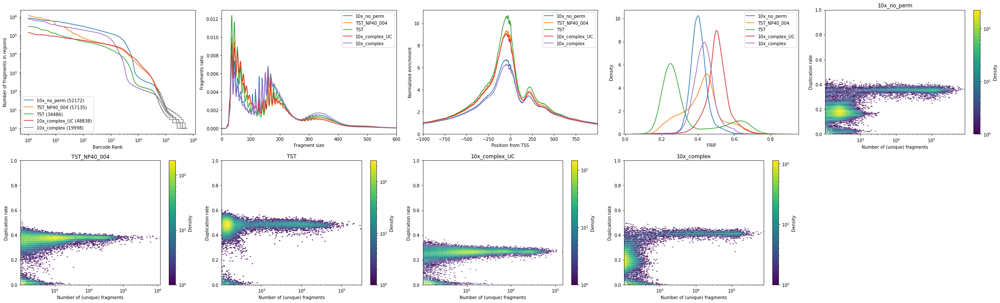

In [7]:
from pycisTopic.qc import *
plot_sample_metrics(profile_data_dict,
           insert_size_distribution_xlim=[0,600],
           ncol=5,
           plot=True,
           save= outDir + 'quality_control/sample_metrics.pdf',
           duplicate_rate_as_hexbin = True)

### 3b. Barcode level statistics

Barcode-level statistics can be used to select high quality cells. Typical measurements that can be used are:

* **Total number of (unique) fragments**
* **TSS enrichment**: The score at position in the TSS enrichmen score for for each barcode (at position 0, the TSS). Noisy cells will have a low TSS enrichment.
* **FRIP**: The fraction of reads in peaks for each barcode. Noisy cells have low FRIP values. However, this filter should be used with nuance, as it depends on the quality of the original peaks. For example, if there is a rare population in the sample, its specific peaks may be missed by peak calling algorithms, causing a decrease in their FRIP values.

In [8]:
# Load barcode metrics
import pickle
infile = open(outDir + 'quality_control/metadata_bc.pkl', 'rb')
metadata_bc = pickle.load(infile)
infile.close()

In [11]:
# Return figure to plot together with other metrics, and cells passing filters. Figure will be saved as pdf.
from pycisTopic.qc import *
FRIP_NR_FRAG_fig = {}
FRIP_NR_FRAG_filter = {}
TSS_NR_FRAG_fig = {}
TSS_NR_FRAG_filter = {}
DR_NR_FRAG_fig = {}
for sample in metadata_bc.keys():
    FRIP_NR_FRAG_fig[sample], FRIP_NR_FRAG_filter[sample]=plot_barcode_metrics(metadata_bc[sample],
                                           var_x='Log_unique_nr_frag',
                                           var_y='FRIP',
                                           min_x=3,
                                           max_x=None,
                                           min_y=0.4,
                                           max_y=None,
                                           return_cells=True,
                                           return_fig=True,
                                           plot=False,
                                           save= outDir + 'quality_control/barcode_metrics_FRIP-VS-NRFRAG_'+sample+'.pdf')
    # Return figure to plot together with other metrics, and cells passing filters
    TSS_NR_FRAG_fig[sample], TSS_NR_FRAG_filter[sample]=plot_barcode_metrics(metadata_bc[sample],
                                          var_x='Log_unique_nr_frag',
                                          var_y='TSS_enrichment',
                                          min_x=3,
                                          max_x=None,
                                          min_y=4,
                                          max_y=None,
                                          return_cells=True,
                                          return_fig=True,
                                          plot=False,
                                          save= outDir + 'quality_control/barcode_metrics_TSS-VS-NRFRAG_'+sample+'.pdf')
    # Return figure to plot together with other metrics, but not returning cells (no filter applied for the duplication rate  per barcode)
    DR_NR_FRAG_fig[sample]=plot_barcode_metrics(metadata_bc[sample],
                                          var_x='Log_unique_nr_frag',
                                          var_y='Dupl_rate',
                                          min_x=3,
                                          max_x=None,
                                          min_y=None,
                                          max_y=None,
                                          return_cells=False,
                                          return_fig=True,
                                          plot=False,
                                          plot_as_hexbin = True)

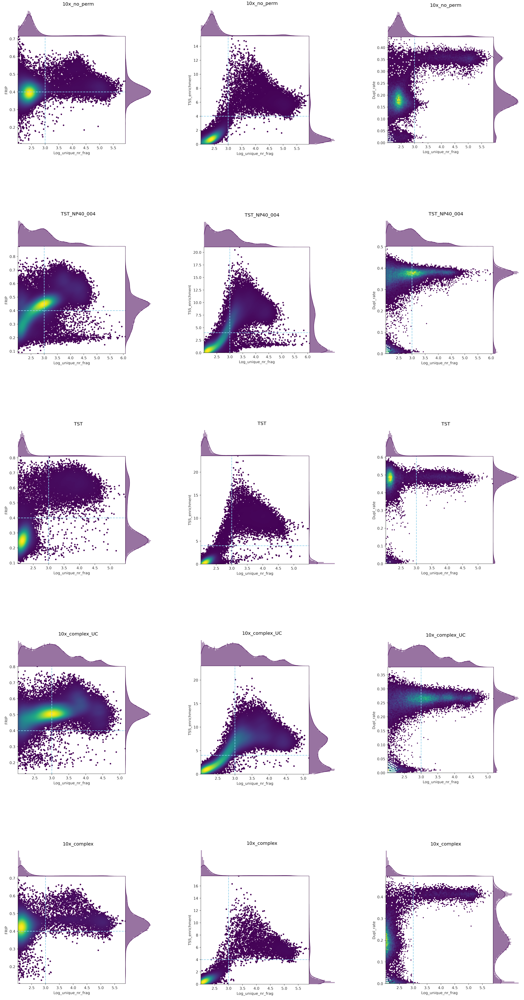

In [18]:
# Plot barcode stats in one figure
fig=plt.figure(figsize=(40, 80))
i=1
for sample in FRIP_NR_FRAG_fig.keys():
    plt.subplot(5, 3, i)
    plt.gca().set_title(sample, fontsize=20)
    i += 1
    img = fig2img(FRIP_NR_FRAG_fig[sample]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    plt.subplot(5, 3, i)
    plt.gca().set_title(sample, fontsize=20)
    i += 1
    img = fig2img(TSS_NR_FRAG_fig[sample])
    plt.imshow(img)
    plt.axis('off')
    plt.subplot(5, 3, i)
    plt.gca().set_title(sample, fontsize=20)
    i += 1
    img = fig2img(DR_NR_FRAG_fig[sample])
    plt.imshow(img)
    plt.axis('off')
plt.savefig(outDir + 'quality_control/combined_qc.pdf')

We select now the cells passing filters:

In [19]:
sel_cells_dict = {}
for sample in FRIP_NR_FRAG_filter.keys():
    sel_cells_dict[sample] = list((set(FRIP_NR_FRAG_filter[sample]) & set(TSS_NR_FRAG_filter[sample])))

Let's check how many match with the scRNA-seq part of the multiome:

In [20]:
# Get metadata from loom file
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
path_to_annotated_rna_loom = projDir + 'data/MO_GEX_seurat_Cortex.loom'
loom = SCopeLoom.read_loom(path_to_annotated_rna_loom)
cell_data = get_metadata(loom)

In [21]:
cell_data = get_metadata(loom)
cell_data = cell_data.replace('TEW__c14e1d__Multiome_RNA_brain_10x_no_perm', '10x_no_perm')
cell_data = cell_data.replace('TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004', 'TST_NP40_004')
cell_data = cell_data.replace('TEW__75da5c__5b0f59__Multiome_brain_TST', 'TST')
cell_data = cell_data.replace('TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC', '10x_complex_UC')
cell_data = cell_data.replace('TEW__d112c8__547ada__Multiome_RNA_brain_10x_complex', '10x_complex')

In [22]:
cell_data['barcode'] = [x.split('___')[0] for x in cell_data.index.tolist()]

In [23]:
cell_data = cell_data[['sample_id', 'barcode']]
sel_cells_rna = {x: cell_data[cell_data['sample_id'] == x]['barcode'].tolist() for x in set(cell_data['sample_id'])}

In [24]:
for sample in sel_cells_dict.keys():
    sel_cells_dict[sample] = list((set(sel_cells_dict[sample]) & set(sel_cells_rna[sample])))

We keep cells that have high quality profiles in both the scATAC-seq and scRNA-seq data (19,485 cells).

In [25]:
import pickle 
with open(outDir +'/quality_control/bc_passing_filters.pkl', 'wb') as f:
  pickle.dump(sel_cells_dict, f)

## 4. Create cisTopic object

In this step a fragments count matrix will be generated, in which the fragments in each region for each barcode is indicated. For multiple samples, you can add additional entries in `fragment_dict`, and a cisTopic object will be generated per sample. As regions, we will use the consensus peaks derived from the scRNA-seq annotations. This cisTopic object will contain:

* Path/s to fragment file/s (if generated from fragments files)
* Fragment count matrix and binary accessibility matrix
* Cell and region metadata

In [6]:
# Path to regions
path_to_regions = outDir + 'consensus_peak_calling/consensus_regions.bed'
# Blacklist
path_to_blacklist = '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/pycisTopic/blacklist/mm10-blacklist.v2.bed'
# Metrics
import pickle
infile = open(outDir + 'quality_control/metadata_bc.pkl', 'rb')
metadata_bc = pickle.load(infile)
infile.close()
# Valid barcodes
import pickle
infile = open(outDir +'/quality_control/bc_passing_filters.pkl', 'rb')
bc_passing_filters = pickle.load(infile)
infile.close()
#Create objects
from pycisTopic.cistopic_class import *
cistopic_obj_list=[create_cistopic_object_from_fragments(path_to_fragments=fragments_dict[key],
                                               path_to_regions=path_to_regions,
                                               path_to_blacklist=path_to_blacklist,
                                               metrics=metadata_bc[key],
                                               valid_bc=bc_passing_filters[key],
                                               n_cpu=5,
                                               project=key) for key in fragments_dict.keys()]

2022-08-09 09:27:19,812 cisTopic     INFO     Reading data for 10x_no_perm
2022-08-09 09:31:53,382 cisTopic     INFO     metrics provided!
2022-08-09 09:32:23,275 cisTopic     INFO     valid_bc provided, selecting barcodes!
2022-08-09 09:32:43,551 cisTopic     INFO     Counting fragments in regions


2022-08-09 09:32:46,779	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


2022-08-09 09:33:33,022 cisTopic     INFO     Creating fragment matrix
2022-08-09 09:35:26,326 cisTopic     INFO     Converting fragment matrix to sparse matrix
2022-08-09 09:35:57,132 cisTopic     INFO     Removing blacklisted regions
2022-08-09 09:35:59,873 cisTopic     INFO     Creating CistopicObject
2022-08-09 09:36:02,879 cisTopic     INFO     Done!
2022-08-09 09:36:03,687 cisTopic     INFO     Reading data for TST_NP40_004
2022-08-09 09:37:57,270 cisTopic     INFO     metrics provided!
2022-08-09 09:38:08,490 cisTopic     INFO     valid_bc provided, selecting barcodes!
2022-08-09 09:38:16,570 cisTopic     INFO     Counting fragments in regions


2022-08-09 09:38:19,850	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


2022-08-09 09:38:49,256 cisTopic     INFO     Creating fragment matrix
2022-08-09 09:40:39,117 cisTopic     INFO     Converting fragment matrix to sparse matrix
2022-08-09 09:41:16,394 cisTopic     INFO     Removing blacklisted regions
2022-08-09 09:41:19,066 cisTopic     INFO     Creating CistopicObject
2022-08-09 09:41:21,709 cisTopic     INFO     Done!
2022-08-09 09:41:22,545 cisTopic     INFO     Reading data for TST
2022-08-09 09:42:09,909 cisTopic     INFO     metrics provided!
2022-08-09 09:42:15,274 cisTopic     INFO     valid_bc provided, selecting barcodes!
2022-08-09 09:42:18,485 cisTopic     INFO     Counting fragments in regions


2022-08-09 09:42:22,111	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


2022-08-09 09:42:43,416 cisTopic     INFO     Creating fragment matrix
2022-08-09 09:44:12,282 cisTopic     INFO     Converting fragment matrix to sparse matrix
2022-08-09 09:44:39,634 cisTopic     INFO     Removing blacklisted regions
2022-08-09 09:44:42,126 cisTopic     INFO     Creating CistopicObject
2022-08-09 09:44:43,871 cisTopic     INFO     Done!
2022-08-09 09:44:44,984 cisTopic     INFO     Reading data for 10x_complex_UC
2022-08-09 09:47:16,133 cisTopic     INFO     metrics provided!
2022-08-09 09:47:31,873 cisTopic     INFO     valid_bc provided, selecting barcodes!
2022-08-09 09:47:42,828 cisTopic     INFO     Counting fragments in regions


2022-08-09 09:47:47,539	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


2022-08-09 09:48:19,150 cisTopic     INFO     Creating fragment matrix
2022-08-09 09:51:45,333 cisTopic     INFO     Converting fragment matrix to sparse matrix
2022-08-09 09:52:36,428 cisTopic     INFO     Removing blacklisted regions
2022-08-09 09:52:38,972 cisTopic     INFO     Creating CistopicObject
2022-08-09 09:52:45,732 cisTopic     INFO     Done!
2022-08-09 09:52:47,704 cisTopic     INFO     Reading data for 10x_complex
2022-08-09 09:54:42,883 cisTopic     INFO     metrics provided!
2022-08-09 09:54:53,360 cisTopic     INFO     valid_bc provided, selecting barcodes!
2022-08-09 09:55:01,783 cisTopic     INFO     Counting fragments in regions


2022-08-09 09:55:05,686	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


2022-08-09 09:55:41,631 cisTopic     INFO     Creating fragment matrix
2022-08-09 09:56:51,172 cisTopic     INFO     Converting fragment matrix to sparse matrix
2022-08-09 09:57:16,218 cisTopic     INFO     Removing blacklisted regions
2022-08-09 09:57:18,855 cisTopic     INFO     Creating CistopicObject
2022-08-09 09:57:21,329 cisTopic     INFO     Done!


Since in this case we have multiple samples, we have to merge the list of cisTopic objects into a unique object.

In [7]:
cistopic_obj = merge(cistopic_obj_list)

2022-08-09 09:58:30,928 cisTopic     INFO     cisTopic object 1 merged
2022-08-09 09:58:41,004 cisTopic     INFO     cisTopic object 2 merged
2022-08-09 09:58:53,013 cisTopic     INFO     cisTopic object 3 merged
2022-08-09 09:59:09,175 cisTopic     INFO     cisTopic object 4 merged


In [8]:
print(cistopic_obj)

CistopicObject from project cisTopic_merge with n_cells × n_regions = 19485 × 568403


We can add additional metadata (for regions or cells) to a cisTopic object. For example, let's add the scRNA-seq data annotations. For those barcodes that did not pass the scRNA-seq values will be filled with `Nan`.

In [9]:
# Get metadata from loom file
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
path_to_annotated_rna_loom = projDir + 'data/MO_GEX_seurat_Cortex.loom'
loom = SCopeLoom.read_loom(path_to_annotated_rna_loom)
cell_data = get_metadata(loom)

In [10]:
# Format the sample name to match the keys in fragments_dict
cell_data = get_metadata(loom)
cell_data = cell_data.replace('TEW__c14e1d__Multiome_RNA_brain_10x_no_perm', '10x_no_perm')
cell_data = cell_data.replace('TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004', 'TST_NP40_004')
cell_data = cell_data.replace('TEW__75da5c__5b0f59__Multiome_brain_TST', 'TST')
cell_data = cell_data.replace('TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC', '10x_complex_UC')
cell_data = cell_data.replace('TEW__d112c8__547ada__Multiome_RNA_brain_10x_complex', '10x_complex')

The indexes in the pandas data frame to add can be **cell barcodes** (if the cisTopic object has been created from a fragments file only) or an **exact match with the cell names** in the cisTopic object (`cistopic_obj.cell_names`). 

In [11]:
cell_data['barcode'] = [x.split('___')[0] for x in cell_data.index.tolist()]

In [12]:
cell_data.index = cell_data['barcode'] + '___' + cell_data['sample_id']

In [13]:
cistopic_obj.add_cell_data(cell_data)

Columns ['barcode', 'sample_id'] will be overwritten


Optionally, you can run also scrublet on the fragment count matrix to infer doublets from the scATAC-seq. Note that if you have multiple samples, scrublet must be run per sample.

In [14]:
# Run scrublet
import scrublet as scr
import pandas as pd
scrublet_pd_list=[]
for sample_id in set(cistopic_obj.cell_data['sample_id']):
    cistopic_obj_sample_id = cistopic_obj.subset(cells=cistopic_obj.cell_data[cistopic_obj.cell_data.sample_id== sample_id].index.to_list(),copy=True)
    scrub = scr.Scrublet(cistopic_obj_sample_id.fragment_matrix.T, expected_doublet_rate=0.1)
    doublet_scores, predicted_doublets = scrub.scrub_doublets()
    scrub.call_doublets(threshold=0.4)
    scrublet_pd_list.append(pd.DataFrame([scrub.doublet_scores_obs_, scrub.predicted_doublets_], columns=cistopic_obj_sample_id.cell_names, index=['Doublet_scores_fragments', 'Predicted_doublets_fragments']).T)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.67
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 2.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 6.5%
Elapsed time: 69.0 seconds
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 17.3%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 16.9%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.51
Detected doublet rate = 0.9%
Estimated detectable doublet fraction = 38.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.3%
Elapsed time: 33.0 seconds
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 44.5%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 4.7%
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calc

We can know add scrublet results to the object. In this case, we will not filter out predicted doublets, but we will use the information a posteriori to confirm if we have doublet clusters.

In [15]:
scrublet_pd = pd.concat(scrublet_pd_list)
cistopic_obj.add_cell_data(scrublet_pd)

In [16]:
# Save
with open(outDir + 'cisTopicObject.pkl', 'wb') as f:
  pickle.dump(cistopic_obj, f)

## 5. Run models

The next step is to run the LDA models. There are two types of LDA models (with Collapsed Gibbs Sampling) you can run:

* **Serial LDA**: The parallelization is done between models rather than within each model. Recommended for small-medium sized data sets in which several models with different number os topics are being tested. You can run these models with `runCGSModels()`.
* **Parallel LDA with MALLET**: The parallelization is done within each model. Recommended for large data sets where a few models with different number of topics are being tested. If working in a cluster, we recommed to submit a job per model so they can run simultaneously. You can run it with `runCGSModelsMallet()`.

In this tutorial we will use Mallet.

In [1]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [ ]:
# Load functions 
from pycisTopic.lda_models import *
# Configure path Mallet
path_to_mallet_binary='mallet'
import os
os.environ['MALLET_MEMORY'] = '250G'
# Run models
outDir = '/staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/'
models=run_cgs_models_mallet(path_to_mallet_binary,
                    cistopic_obj,
                    n_topics=[2, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
                    n_cpu=10,
                    n_iter=500,
                    random_state=555,
                    alpha=50,
                    alpha_by_topic=True,
                    eta=0.1,
                    eta_by_topic=False,
                    tmp_path='/scratch/leuven/313/vsc31305/tmp/mallet/TEW_cortex/', #Use SCRATCH if many models or big data set
                    save_path='/scratch/leuven/313/vsc31305/tmp/mallet/TEW_cortex/')
# Save
with open(outDir + 'models/mallet.pkl', 'wb') as f:
  pickle.dump(models, f)

In [ ]:
# Save
with open(outDir + 'models/mallet.pkl', 'wb') as f:
  pickle.dump(models, f)

If you are working on a cluster and want to run several models, we recommend to submit this step as a job. You can use the `runModels_lda_mallet.py` script.

In [ ]:
%%bash
#!/bin/bash -l
## Job will last 12 hours.
#PBS -l walltime=12:00:00
## Job needs 1 nodes and 24 cores per node.
#PBS -l nodes=1:ppn=24
## Job request memory
#PBS -lmem=180gb # or 180gb
## Specify project credits name to use credits for running the job.
#PBS -A lp_symbiosys
## Batch job name.
#PBS -N 10x_multiomics_brain
## Email options.
#PBS -m abe
#PBS -M carmen.bravogonzalezblas@kuleuven.vib.be

module load Python/3.7.4-foss-2018a
cd /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/pycisTopic
singularity exec -B /lustre1,/staging,/data,/vsc-hard-mounts,/scratch scenicplus.sif python pycisTopic/model_scripts/runModels_lda_mallet.py \
        -i /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/tutorial/cisTopicObject.pkl \
        -o /staging/leuven/stg_00002/lcb/cbravo/Multiomics_pipeline/analysis/10x_multiome_mouse_cortex/TEW_cortex/pycisTopic/tutorial/models/mallet.pkl \
        -nt 2,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95,100 \
        -c 23 \
        -it 500 \
        -a 50 \
        -abt True \
        -e 0.1 \
        -ebt False \
        -sp /scratch/leuven/313/vsc31305/cortex_tutorial/mallet/intermediate_models \
        -s 555 \
        -td /scratch/leuven/313/vsc31305/cortex_tutorial/mallet/tmp

## 6. Model selection

There are several methods that can be used for model selection:

* **Minmo_2011**: Uses the average model coherence as calculated by Mimno et al (2011). In order to reduce the impact of the number of topics, we calculate the average coherence based on the top selected average values. The better the model, the higher coherence.
* **Log-likelihood**: Uses the log-likelihood in the last iteration as calculated by Griffiths and Steyvers (2004). The better the model, the higher the log-likelihood.
* **Arun_2010**: Uses a density-based metric as in Arun et al (2010) using the topic-region distribution, the cell-topic distribution and the cell coverage. The better the model, the lower the metric.
* **Cao_Juan_2009**: Uses a divergence-based metric as in Cao Juan et al (2009) using the topic-region distribution. The better the model, the lower the metric.

For scATAC-seq data models, the most helpful methods are Minmo (topic coherence) and the log-likelihood in the last iteration.

In [23]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()
# Load models
import pickle
infile = open(outDir + 'models/mallet.pkl', 'rb')
models = pickle.load(infile)
infile.close()

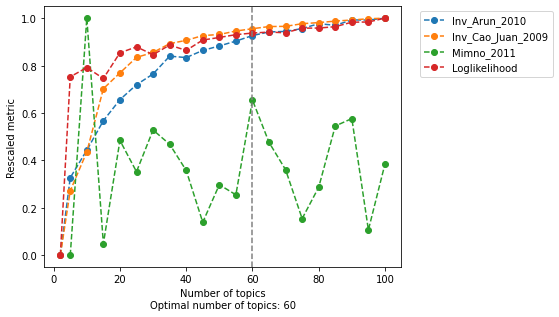

In [24]:
from pycisTopic.lda_models import *
model=evaluate_models(models,
                     select_model=60, 
                     return_model=True, 
                     metrics=['Arun_2010','Cao_Juan_2009', 'Minmo_2011', 'loglikelihood'],
                     plot_metrics=False,
                     save= outDir + 'models/model_selection.pdf')

In [25]:
# Add model to cisTopicObject
cistopic_obj.add_LDA_model(model)

In [26]:
# Save
with open(outDir + 'cisTopicObject.pkl', 'wb') as f:
  pickle.dump(cistopic_obj, f)

## 7. Clustering and visualization

We can cluster the cells (or regions) using the leiden algorithm, and perform dimensionality reductiion with UMAP and TSNE. In these examples we will focus on the cells only. For these steps, the cell-topic contriibutions of the model will be used. In this tutorial we will not perform clustering as we will use the scRNA-seq labels, but you can take a look to the `find_clusters` function or the human cerebellum/melanoma tutorials.

In [7]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [27]:
from pycisTopic.clust_vis import *
run_umap(cistopic_obj,
                 target  = 'cell', scale=False)
run_tsne(cistopic_obj,
                 target  = 'cell', scale=False)

2022-08-09 11:02:47,630 cisTopic     INFO     Running UMAP
2022-08-09 11:03:22,418 cisTopic     INFO     Running FItSNE
Will use momentum during exaggeration phase
Computing input similarities...
Using perplexity, so normalizing input data (to prevent numerical problems)
Using perplexity, not the manually set kernel width.  K (number of nearest neighbors) and sigma (bandwidth) parameters are going to be ignored.
Using ANNOY for knn search, with parameters: n_trees 50 and search_k 4500
Going to allocate memory. N: 19485, K: 90, N*K = 1753650
Building Annoy tree...
Done building tree. Beginning nearest neighbor search... 
parallel (36 threads):


We observe a very strong batch effect due to the different sample preparation protocols.

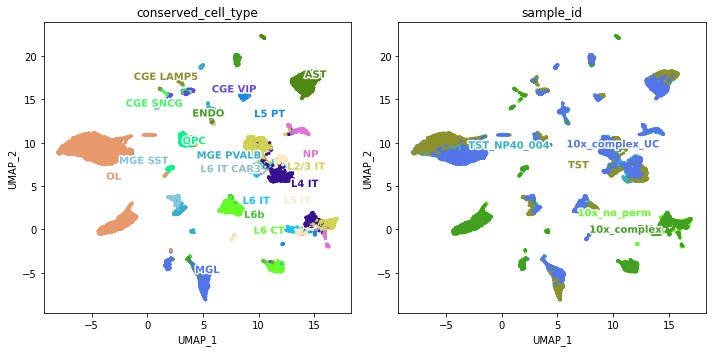

In [28]:
os.mkdir(outDir + 'visualization/')
plot_metadata(cistopic_obj,
                 reduction_name='UMAP',
                 variables=['conserved_cell_type', 'sample_id'], # Labels from RNA and new clusters
                 target='cell', num_columns=2,
                 text_size=10,
                 dot_size=5,
                 figsize=(10,5),
                 save= outDir + 'visualization/dimensionality_reduction_label_uncorrected.pdf')

Taking a closer look to the cell-topic distribution, we observe cell-type specific and cell-type+sample specific topics. For example, topic 1 is shared between all oligodendrocytes, while topics 20 and 59 are sample dependant oligodendrocyte topics.

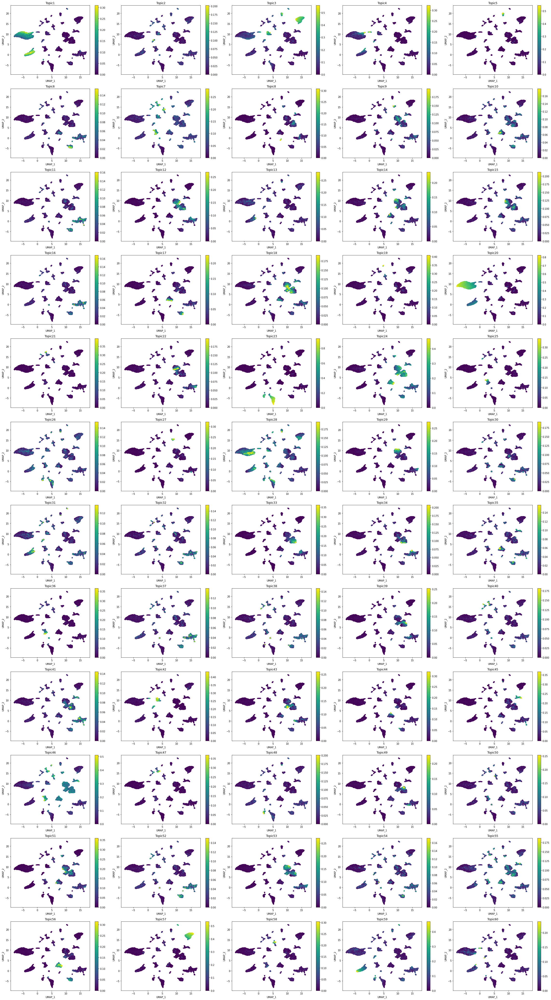

In [29]:
plot_topic(cistopic_obj,
            reduction_name = 'UMAP',
            target = 'cell',
            num_columns=5,
            save= outDir + 'visualization/dimensionality_reduction_topic_uncorrected.pdf')

pycisTopic allows to use harmony of cell-topic distributions to correct this kind of batch effects. Let's give it a try:

In [30]:
# Harmony
harmony(cistopic_obj, 'sample_id', random_state=555)  
# UMAP
run_umap(cistopic_obj, reduction_name='harmony_UMAP',
                 target  = 'cell', harmony=True)
run_tsne(cistopic_obj, reduction_name='harmony_tSNE',
                 target  = 'cell', harmony=True)

2022-08-09 11:17:10,012 - harmonypy - INFO - Iteration 1 of 10


2022-08-09 11:17:10,012 harmonypy    INFO     Iteration 1 of 10


2022-08-09 11:17:15,840 - harmonypy - INFO - Iteration 2 of 10


2022-08-09 11:17:15,840 harmonypy    INFO     Iteration 2 of 10


2022-08-09 11:17:22,773 - harmonypy - INFO - Iteration 3 of 10


2022-08-09 11:17:22,773 harmonypy    INFO     Iteration 3 of 10


2022-08-09 11:17:30,808 - harmonypy - INFO - Converged after 3 iterations


2022-08-09 11:17:30,808 harmonypy    INFO     Converged after 3 iterations
2022-08-09 11:17:30,817 cisTopic     INFO     Running UMAP
2022-08-09 11:17:47,364 cisTopic     INFO     Running FItSNE

Symmetrizing...
Using the given initialization.
Exaggerating Ps by 12.000000
Input similarities computed (sparsity = 0.006294)!
Learning embedding...
Using FIt-SNE approximation.
Iteration 50 (50 iterations in 0.73 seconds), cost 5.024977
Iteration 100 (50 iterations in 0.69 seconds), cost 4.155963
Iteration 150 (50 iterations in 0.73 seconds), cost 3.779132
Iteration 200 (50 iterations in 0.69 seconds), cost 3.755377
Iteration 250 (50 iterations in 0.71 seconds), cost 3.705882
Unexaggerating Ps by 12.000000
Iteration 300 (50 iterations in 0.72 seconds), cost 2.768035
Iteration 350 (50 iterations in 0.69 seconds), cost 2.269992
Iteration 400 (50 iterations in 1.02 seconds), cost 1.992158
Iteration 450 (50 iterations in 1.65 seconds), cost 1.848541
Iteration 500 (50 iterations in 2.16 seconds),

Indeed, now we observe that cells cluster by cell type.

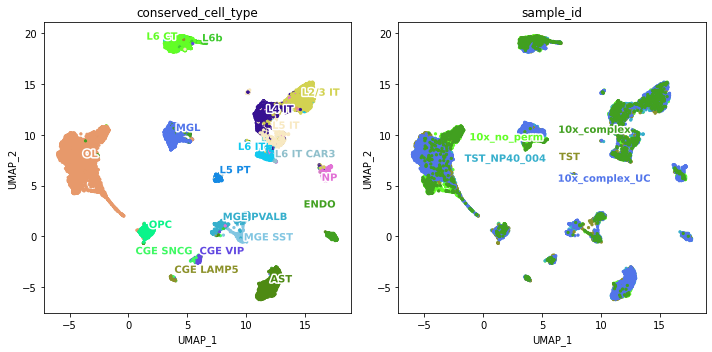

In [37]:
plot_metadata(cistopic_obj,
                 reduction_name='harmony_UMAP',
                 variables=['conserved_cell_type', 'sample_id'], # Labels from RNA and new clusters
                 target='cell', num_columns=2,
                 text_size=10,
                 dot_size=5,
                 figsize=(10,5),
                 save= outDir + 'visualization/dimensionality_reduction_label_corrected.pdf')

We can also color this representation by topic contribution. Note that we do not remove the sample-specific topics, as these can still be explored to check if the batch has a biological effect.

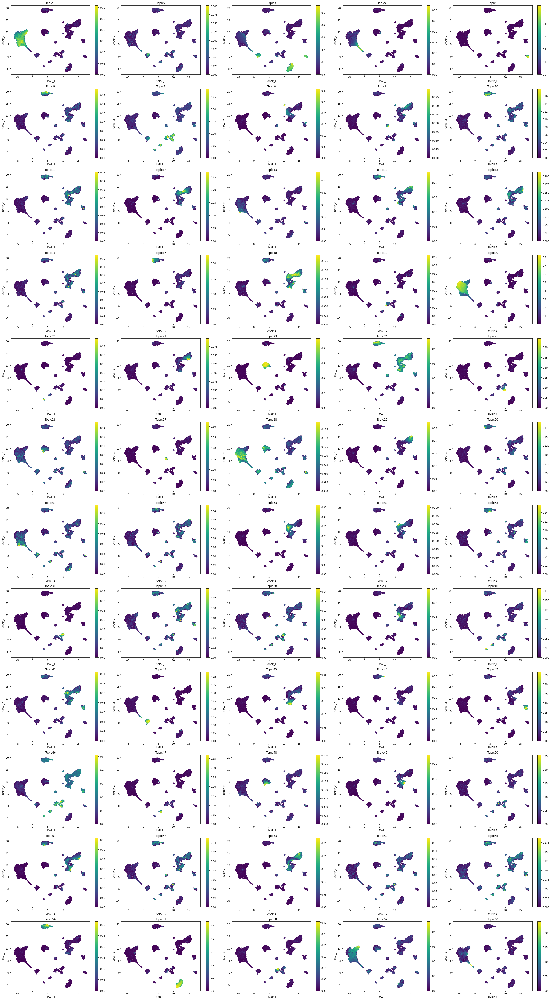

In [38]:
plot_topic(cistopic_obj,
            reduction_name = 'harmony_UMAP',
            target = 'cell',
            num_columns=5,
            save= outDir + 'visualization/dimensionality_reduction_topic_corrected.pdf')

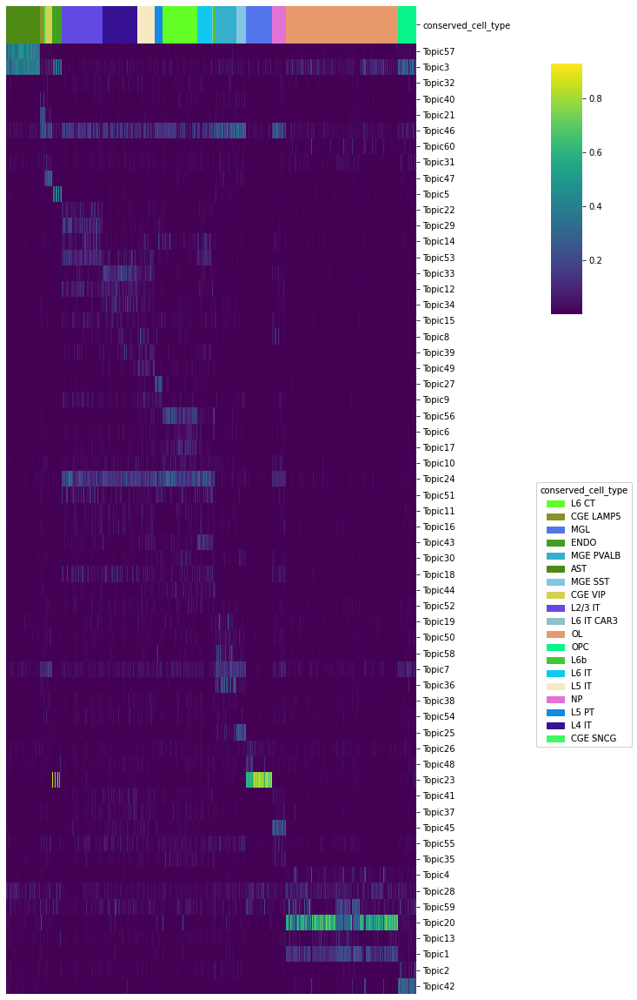

In [40]:
from pycisTopic.clust_vis import *
cell_topic_heatmap(cistopic_obj,
                     variables = ['conserved_cell_type'],
                     scale = False,
                     legend_loc_x = 1.05,
                     legend_loc_y = -1.2,
                     legend_dist_y = -1,
                     figsize=(10,20),
                     save = outDir + 'visualization/heatmap_topic_contr.pdf')

In [41]:
# Save
with open(outDir + 'cisTopicObject.pkl', 'wb') as f:
  pickle.dump(cistopic_obj, f)

## 8. Topic binarization

Next we can binarize topic-region and cell-topic distributions. The first is useful for exploring the topics with other tools that work with region sets (e.g. GREAT, cisTarget); while the latter is useful to automatically automate topics.

In [42]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

We will first binarize the topic-region distributions. There are several methods that can be used for this: 'otsu' (Otsu, 1979), 'yen' (Yen et al., 1995), 'li'
(Li & Lee, 1993), 'aucell' (Van de Sande et al., 2020) or 'ntop' (Taking the top n regions per topic). Otsu and Yen's methods work well in topic-region distributions; however for some downstream analyses it may be convenient to use 'ntop' to have balanced region sets.

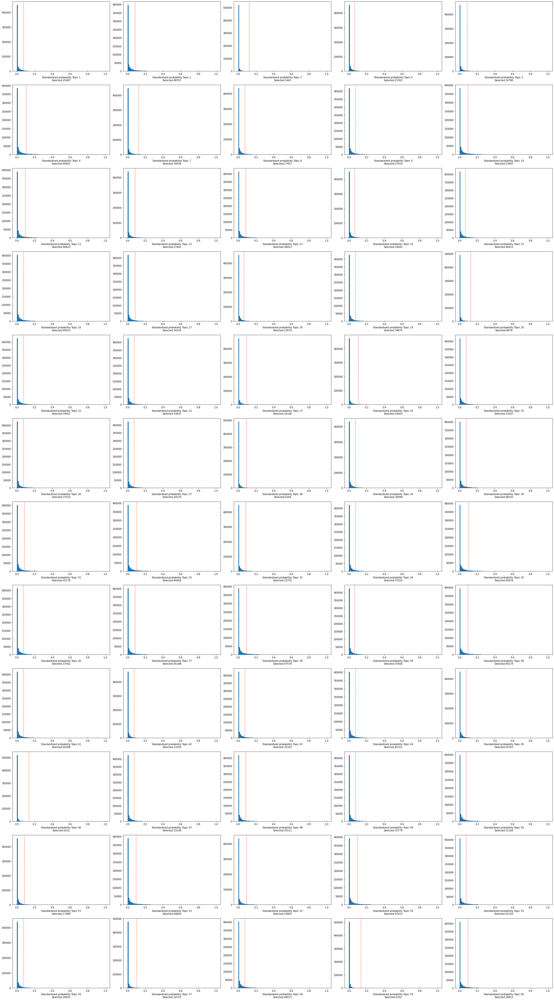

In [43]:
os.mkdir(outDir+'topic_binarization')
from pycisTopic.topic_binarization import *
region_bin_topics = binarize_topics(cistopic_obj, method='otsu', ntop=3000, plot=True, num_columns=5, save= outDir + 'topic_binarization/otsu.pdf')

Similarly, we can now binarize the cell-topic distribions. 

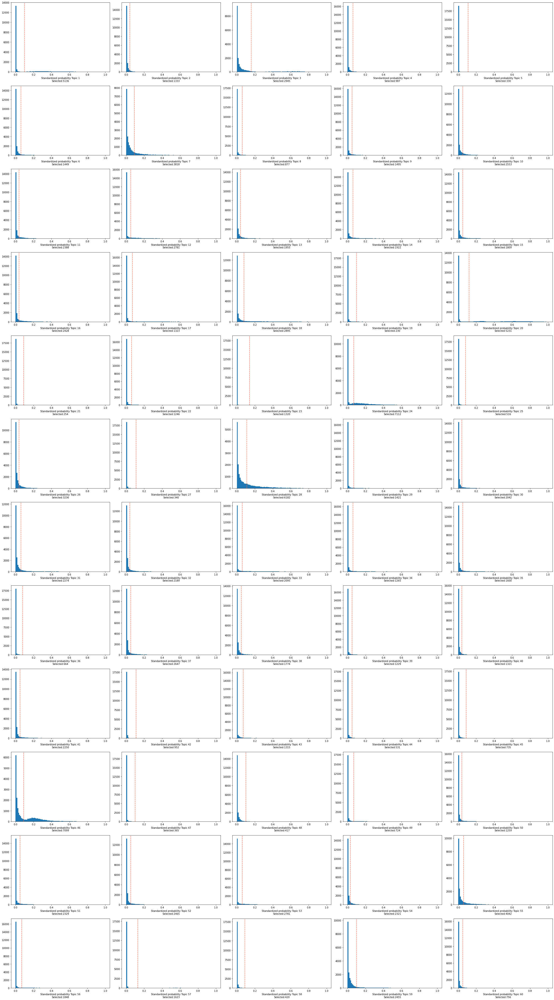

In [44]:
binarized_cell_topic = binarize_topics(cistopic_obj, target='cell', method='li', plot=True, num_columns=5, nbins=100)

Following, we can compute the topic quality control metrics. These include:

* **Number of assignments**
* **Topic coherence (Mimno et al., 2011)**: Measures to which extent high scoring regions in the topic are actually co-accessible in the original data. If it is low it indicates that the topic is rather random. The higher, the better is a topic. 
* **The marginal topic distribution**: Indicates how much each topic contributes to the model. The higher, the better is a topic.
* **The gini index**: Value between 0 and 1, that indicates the specificity of topics (0: General, 1:Specific)
* If topics have been binarized, the number of regions/cells per topic will be added.

In [45]:
from pycisTopic.topic_qc import *
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

We will create a figure dictionary to put all plots together. In this case, we will not put any threshold to filter topics.

In [46]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

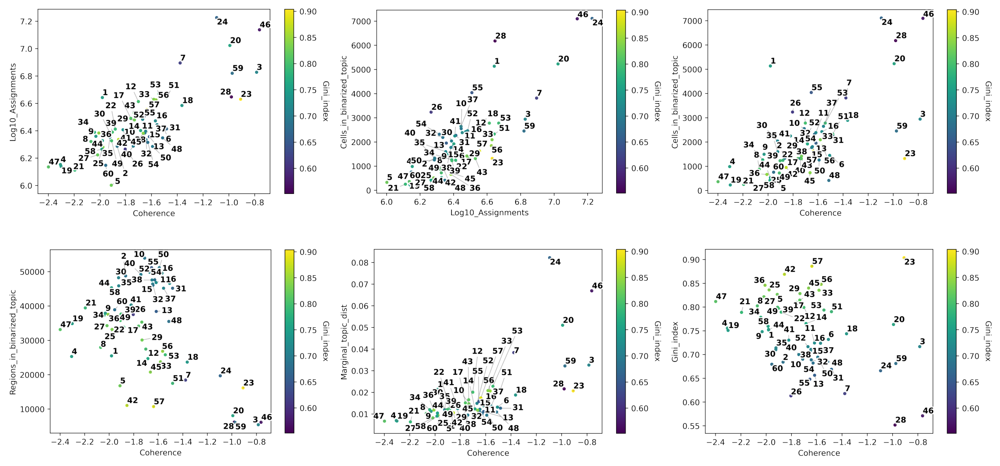

In [47]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
fig.savefig(outDir + 'topic_binarization/Topic_qc.pdf', bbox_inches='tight')
plt.show()

Topic 23 (Microglia) is an example of a good topic: it has a high coherence and a high number of assignmnents/marginal topic score (these measurements are correlated), while being cell type specific (with a high gini index). Generally, we will consider a topic as bad if it has a low number of assignments while being assigned to many cells and a low coherence. 

Next, we can automatically annotate topics, in this case by cell type. Here we calculate the proportion of cells in each group that are assigned to the binarized topic in comparison to the ratio in the whole data set. We will consider a topic as general if the difference between the ration of cells in the whole data set in the binarized topic and the ratio of total cells in the assigned groups is above 0.2. This indicates that the topic is general, and the propotion test may fail if the topic is enriched in both foreground (the group) and background (the whole data set); resulting in a big difference between the ratios.

In [49]:
topic_annot = topic_annotation(cistopic_obj, annot_var='conserved_cell_type', binarized_cell_topic=binarized_cell_topic, general_topic_thr = 0.2)

In [50]:
topic_annot

,conserved_cell_type,Ratio_cells_in_topic,Ratio_group_in_population,is_general
Topic1,OL,0.263587,0.275083,False
Topic2,"MGE PVALB, AST, MGE SST, CGE VIP, OPC, CGE SNCG",0.068412,0.219451,False
Topic3,"ENDO, AST, OPC",0.151142,0.149089,False
Topic4,OL,0.050654,0.275083,False
Topic5,ENDO,0.016936,0.022735,False
Topic6,"L6 CT, L6b, L6 IT, L5 PT",0.074365,0.144983,False
Topic7,"CGE LAMP5, MGE PVALB, MGE SST, CGE VIP, OPC, L...",0.195946,0.207647,False
Topic8,"L5 IT, NP, L5 PT, L4 IT",0.045009,0.181884,False
Topic9,"MGE SST, L2/3 IT, L5 IT, NP, L5 PT",0.076726,0.218989,False
Topic10,"L6 CT, CGE LAMP5, MGE SST, L2/3 IT, L6b, L6 IT...",0.131024,0.440852,False


We can merge the topic metrics and their annotation in a data frame.

In [51]:
topic_qc_metrics = pd.concat([topic_annot[['conserved_cell_type', 'Ratio_cells_in_topic', 'Ratio_group_in_population']], topic_qc_metrics], axis=1)

In [52]:
topic_qc_metrics

,conserved_cell_type,Ratio_cells_in_topic,Ratio_group_in_population,Log10_Assignments,Assignments,Regions_in_binarized_topic,Cells_in_binarized_topic,Coherence,Marginal_topic_dist,Gini_index
Topic1,OL,0.263587,0.275083,6.642773,4393123.0,25487,5136,-1.980934,0.021375,0.752818
Topic2,"MGE PVALB, AST, MGE SST, CGE VIP, OPC, CGE SNCG",0.068412,0.219451,6.286844,1935727.0,48767,1333,-1.865987,0.009521,0.684181
Topic3,"ENDO, AST, OPC",0.151142,0.149089,6.827509,6722160.0,5443,2945,-0.785087,0.032637,0.716776
Topic4,OL,0.050654,0.275083,6.153315,1423360.0,25302,987,-2.305897,0.007000,0.755645
Topic5,ENDO,0.016936,0.022735,6.001713,1003952.0,16780,330,-1.911855,0.004949,0.826658
Topic6,"L6 CT, L6b, L6 IT, L5 PT",0.074365,0.144983,6.429411,2687886.0,46601,1449,-1.507483,0.013198,0.731924
Topic7,"CGE LAMP5, MGE PVALB, MGE SST, CGE VIP, OPC, L...",0.195946,0.207647,6.895423,7860017.0,18438,3818,-1.378025,0.038388,0.617900
Topic8,"L5 IT, NP, L5 PT, L4 IT",0.045009,0.181884,6.321473,2096394.0,27957,877,-2.069440,0.010300,0.802529
Topic9,"MGE SST, L2/3 IT, L5 IT, NP, L5 PT",0.076726,0.218989,6.359460,2288023.0,37910,1495,-2.031445,0.011239,0.748206
Topic10,"L6 CT, CGE LAMP5, MGE SST, L2/3 IT, L6b, L6 IT...",0.131024,0.440852,6.445282,2787934.0,53947,2553,-1.710727,0.013675,0.690280


In [53]:
# Save
with open(outDir + 'topic_binarization/Topic_qc_metrics_annot.pkl', 'wb') as f:
  pickle.dump(topic_qc_metrics, f)
with open(outDir + 'topic_binarization/binarized_cell_topic.pkl', 'wb') as f:
  pickle.dump(binarized_cell_topic, f)
with open(outDir + 'topic_binarization/binarized_topic_region.pkl', 'wb') as f:
  pickle.dump(region_bin_topics, f)

## 9. Differentially accessible regions (DARs)

Together with working with regulatory topics, we can also identify differentially accessible regions (DARs) between cell types. First, we will impute the region accessibility exploting the cell-topic and topic-region probabilities. To shrink very low probability values to 0, we use a scale factor (by default: 10^6).

In [7]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [8]:
from pycisTopic.diff_features import *
imputed_acc_obj = impute_accessibility(cistopic_obj, selected_cells=None, selected_regions=None, scale_factor=10**6)

2022-08-09 16:16:09,936 cisTopic     INFO     Imputing drop-outs
2022-08-09 16:16:42,880 cisTopic     INFO     Scaling
2022-08-09 16:17:08,996 cisTopic     INFO     Keep non zero rows
2022-08-09 16:17:47,098 cisTopic     INFO     Imputed accessibility sparsity: 0.605450073496291
2022-08-09 16:17:47,099 cisTopic     INFO     Create CistopicImputedFeatures object
2022-08-09 16:17:47,100 cisTopic     INFO     Done!


Next we will log-normalize the imputed data.

In [9]:
normalized_imputed_acc_obj = normalize_scores(imputed_acc_obj, scale_factor=10**4)

2022-08-09 16:17:47,105 cisTopic     INFO     Normalizing imputed data
2022-08-09 16:19:56,519 cisTopic     INFO     Done!


Optionally, we can identify highly variable regions. This is not mandatory, but will speed up the hypothesis testing step for identifying DARs.

2022-08-09 16:26:06,626 cisTopic     INFO     Calculating mean
2022-08-09 16:26:18,396 cisTopic     INFO     Calculating variance


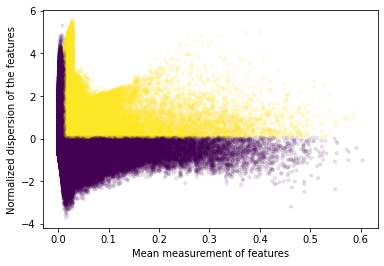

2022-08-09 16:28:11,071 cisTopic     INFO     Done!


In [11]:
#os.mkdir(outDir + 'DARs/')
variable_regions = find_highly_variable_features(normalized_imputed_acc_obj,
                                           min_disp = 0.05,
                                           min_mean = 0.0125, 
                                           max_mean = 3,
                                           max_disp = np.inf,
                                           n_bins=20, 
                                           n_top_features=None,
                                           plot=True,
                                           save= outDir + 'DARs/HVR_plot.pdf')

In [12]:
len(variable_regions)

86538

We can now identify differentially accessible regions between groups. By default, this function will perform a Wilcoxon rank-sum test between each group in the specified variable and the rest. Alternatively, specified contrast can be provided as a list with foreground and background groups (e.g. for group 1 versus group 2 and 3, and group 2 versus group 1 and 3: [[['Group_1'], ['Group_2, 'Group_3']], [['Group_2'], ['Group_1, 'Group_3']]]).

In [13]:
markers_dict= find_diff_features(cistopic_obj, 
                      imputed_acc_obj,
                      variable='conserved_cell_type',
                      var_features=variable_regions,
                      contrasts=None,
                      adjpval_thr=0.05,
                      log2fc_thr=np.log2(1.5),
                      n_cpu=5) 

2022-08-09 16:29:24,150	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(markers_ray pid=41953) 2022-08-09 16:29:28,842 cisTopic     INFO     Formatting data for AST
(markers_ray pid=41954) 2022-08-09 16:29:30,032 cisTopic     INFO     Formatting data for CGE LAMP5
(markers_ray pid=41952) 2022-08-09 16:29:31,176 cisTopic     INFO     Formatting data for CGE SNCG
(markers_ray pid=41951) 2022-08-09 16:29:32,375 cisTopic     INFO     Formatting data for CGE VIP
(markers_ray pid=41950) 2022-08-09 16:29:33,616 cisTopic     INFO     Formatting data for ENDO
(markers_ray pid=41953) 2022-08-09 16:30:32,341 cisTopic     INFO     Computing p-value for AST
(markers_ray pid=41954) 2022-08-09 16:30:33,051 cisTopic     INFO     Computing p-value for CGE LAMP5
(markers_ray pid=41952) 2022-08-09 16:30:35,845 cisTopic     INFO     Computing p-value for CGE SNCG
(markers_ray pid=41951) 2022-08-09 16:30:35,912 cisTopic     INFO     Computing p-value for CGE VIP
(markers_ray pid=41950) 2022-08-09 16:30:36,878 cisTopic     INFO     Computing p-value for ENDO
(markers_ray pid=4

In [14]:
x = [print(x + ': '+ str(len(markers_dict[x]))) for x in markers_dict.keys()]

AST: 17241
CGE LAMP5: 10661
CGE SNCG: 9925
CGE VIP: 10515
ENDO: 14243
L2/3 IT: 34914
L4 IT: 35086
L5 IT: 37025
L5 PT: 27018
L6 CT: 28765
L6 IT: 34548
L6 IT CAR3: 31363
L6b: 20292
MGE PVALB: 11044
MGE SST: 11735
MGL: 14600
NP: 22073
OL: 23824
OPC: 13326


In [17]:
# Save
with open(outDir + 'DARs/Imputed_accessibility.pkl', 'wb') as f:
  pickle.dump(imputed_acc_obj, f)
with open(outDir + 'DARs/DARs.pkl', 'wb') as f:
  pickle.dump(markers_dict, f)
with open(outDir + 'DARs/variable_regions.pkl', 'wb') as f:
  pickle.dump(variable_regions, f)

## 10. Export to loom

We can now create loom files to further explore the results. There are two types of loom files:

* **Region accessibility**: These loom files include the imputed accessibility as matrix, topics as regulons and cell-topic distributions as AUC matrices. The imputed values, the cistopic object used for the imputation and the cell-topic and topic-region binarized distributions are required. Alternatively, we can also provide different clustering and the marker regions (DARs) per group per clustering.

* **Gene activity**: These loom files contain the gene activity as matrix, scRNA-seq derived regulons and their AUC values based on gene activity. The gene activity values, the cistopic object, and scRNA-seq derived regulons are required. Alternatively, we can also provide different clustering and the marker genes (DAGs) per group per clustering.


Here we show how to make the region accessibility files, for more detailed on gene activity visit the human cerebellum and melanoma tutorials.

In [19]:
# Load cisTopic object
import pickle
infile = open(outDir + 'cisTopicObject.pkl', 'rb')
cistopic_obj = pickle.load(infile)
infile.close()
# Load imputed accessibility
import pickle
infile = open(outDir + 'DARs/Imputed_accessibility.pkl', 'rb') #Here I am using pycisTopic gene activity matrix, but could be any :)
imputed_acc_obj = pickle.load(infile)
infile.close()
# Load region binarized topics
import pickle
infile = open(outDir + 'topic_binarization/binarized_topic_region.pkl', 'rb') #Here I am using pycisTopic gene activity matrix, but could be any :)
binarized_topic_region = pickle.load(infile)
infile.close()
# Load cell binarized topics
import pickle
infile = open(outDir + 'topic_binarization/binarized_cell_topic.pkl', 'rb') #Here I am using pycisTopic gene activity matrix, but could be any :)
binarized_cell_topic = pickle.load(infile)
infile.close()
# Load DARs
import pickle
infile = open(outDir + 'DARs/DARs.pkl', 'rb')
DARs_dict = pickle.load(infile)
infile.close()

In [21]:
# To add scRNA-seq embeddings
from loomxpy.loomxpy import SCopeLoom
path_to_annotated_rna_loom = projDir + 'data/MO_GEX_seurat_Cortex.loom'
loom = SCopeLoom.read_loom(path_to_annotated_rna_loom)
rna_embeddings = {key: loom.embeddings[key].get_embedding() for key in loom.embeddings.keys()}

In [22]:
from loomxpy.loomxpy import SCopeLoom
from pycisTopic.loom import *
cell_data = get_metadata(loom)
cell_data = cell_data.replace('TEW__c14e1d__Multiome_RNA_brain_10x_no_perm', '10x_no_perm')
cell_data = cell_data.replace('TEW__3cc0d9__bb22bc__Multiome_brain_TST_NP40_004', 'TST_NP40_004')
cell_data = cell_data.replace('TEW__75da5c__5b0f59__Multiome_brain_TST', 'TST')
cell_data = cell_data.replace('TEW__c3f7c1__1ac906__Multiome_brain_10xcomplex_UC', '10x_complex_UC')
cell_data = cell_data.replace('TEW__d112c8__547ada__Multiome_RNA_brain_10x_complex', '10x_complex')

In [23]:
cell_data['barcode'] = [x.split('___')[0] for x in cell_data.index.tolist()]
cell_data.index = cell_data['barcode'] + '___' + cell_data['sample_id']

In [24]:
for key in rna_embeddings.keys():
    rna_embeddings[key].index = cell_data.index
    rna_embeddings[key] = rna_embeddings[key].loc[cistopic_obj.cell_names,]

In [25]:
# Function
def merge_two_dicts(x, y):
    z = x.copy()   # start with x's keys and values
    z.update(y)    # modifies z with y's keys and values & returns None
    return z

In [27]:
cistopic_obj.projections['cell'] = merge_two_dicts(cistopic_obj.projections['cell'], rna_embeddings)
cistopic_obj.projections['cell']['pycisTopic UMAP'] = cistopic_obj.projections['cell'].pop('UMAP')
cistopic_obj.projections['cell']['pycisTopic tSNE'] = cistopic_obj.projections['cell'].pop('tSNE')
cistopic_obj.projections['cell']['pycisTopic Harmony UMAP'] = cistopic_obj.projections['cell'].pop('harmony_UMAP')
cistopic_obj.projections['cell']['pycisTopic Harmony tSNE'] = cistopic_obj.projections['cell'].pop('harmony_tSNE')

In [28]:
# Prepare DARs dict
os.mkdir(outDir + 'loom')
cluster_markers = {'conserved_cell_type': DARs_dict}
# Export to loom
from pycisTopic.loom import *
export_region_accessibility_to_loom(accessibility_matrix = imputed_acc_obj,
                  cistopic_obj = cistopic_obj, 
                  binarized_topic_region = binarized_topic_region,
                  binarized_cell_topic = binarized_cell_topic,
                  out_fname = outDir + 'loom/pycisTopic_region_accessibility.loom',
                  cluster_annotation = ['conserved_cell_type'],
                  cluster_markers = cluster_markers,
                  tree_structure = ('Mouse_cortex_TEW', 'pycisTopic'),
                  title = 'Region accessibility all',
                  nomenclature = "mm10")   

2022-08-09 17:09:15,021 cisTopic     INFO     Creating minimal loom
2022-08-09 17:24:45,877 cisTopic     INFO     Adding annotations
2022-08-09 17:28:18,078 cisTopic     INFO     Adding clusterings
2022-08-09 17:28:18,512 cisTopic     INFO     Adding markers
2022-08-09 17:28:36,987 cisTopic     INFO     Exporting
